## Trial (1) : PCA + KMeans

In [1]:
# threshold version
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

def change_detection_pca_kmeans(image1, image2, h, rate, min_width=3, min_height=3):
    # Check if images have the same size
    if image1.shape != image2.shape:
        print("Image 1 and 2 must be in the same size")
        return None
    print("image: ",image1.shape)
    rows, cols, _ = image1.shape

    # Convert images to RGB format if necessary
    if len(image1.shape) != 3:
        image1 = np.stack((image1,) * 3, axis=-1) / 255.0
        image2 = np.stack((image2,) * 3, axis=-1) / 255.0

    # Display original images
    plt.figure()
    plt.subplot(2, 2, 1)
    plt.imshow(image1)
    plt.title('Original image 1')
    plt.subplot(2, 2, 2)
    plt.imshow(image2)
    plt.title('Original image 2')

    # Calculate difference image
    dif_image = np.abs(image1 - image2)
    # dif_image=image1
    plt.subplot(2, 2, 3)
    plt.imshow(dif_image)
    plt.title('Difference image')

    # Padding for the difference image
    pad = np.zeros((rows + h - 1, cols + h - 1, 3))
    pad[:rows, :cols, :] = dif_image

    # Divide the difference image into h x h non-overlapping blocks
    vector_set = np.zeros((rows * cols, 3 * h * h))
    count = 0
    for i in range(rows):
        for j in range(cols):
            block = pad[i:i + h, j:j + h, :]
            vector_set[count, :] = block.flatten()
            count += 1

    # PCA algorithm
    mean_vector = np.mean(vector_set, axis=0)
    dif_vector = vector_set - mean_vector
    covar = np.cov(dif_vector, rowvar=False)
    eigvalues, eigvectors = np.linalg.eig(covar)
    eigvectors = np.abs(eigvectors[:, np.argsort(-eigvalues)])
    eigvalues = eigvalues[np.argsort(-eigvalues)]
    eigvectors = eigvectors[:, :int(rate * len(eigvalues))]
    feature = np.dot(vector_set, eigvectors)

    # K-Means algorithm
    kmeans = KMeans(n_clusters=2)
   
    label = kmeans.fit_predict(feature)
    # change_map = np.reshape(label, (rows, cols)).T - 1
    change_map=np.reshape(label,(rows,cols))-1
    print("change map shape",change_map.shape)

    plt.subplot(2, 2, 4)
    plt.imshow(change_map, cmap='gray')
    plt.title('Change map')
    plt.show()

    return change_map


In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.metrics import jaccard_score, accuracy_score

# Load images from folders A and B
folder_A = '../trainval/A'
folder_B = '../trainval/B'
folder_labels = '../trainval/label'

image_filenames = sorted(os.listdir(folder_A))

jaccard_scores = []
accuracies = []
batch_no = 0

for filename in image_filenames:
    # Load images
    image_A = cv2.imread(os.path.join(folder_A, filename))
    image_B = cv2.imread(os.path.join(folder_B, filename))
    label = cv2.imread(os.path.join(folder_labels, filename), cv2.IMREAD_GRAYSCALE)
    kernel_size = (5, 5)  # Adjust kernel size as needed
    image_t1_filtered = cv2.GaussianBlur(image_A, kernel_size, 0)
    image_t2_filtered = cv2.GaussianBlur(image_B, kernel_size, 0)
    
    rows, cols = label.shape
    labelTransposed = np.reshape(label, (rows, cols)).T - 1
    
    # Invert the pixel values
    inverted_label = 255 - labelTransposed

    # Call your change detection function
    change_map = change_detection_pca_kmeans(image_t1_filtered, image_t2_filtered, h=4, rate=3)
    print("CM shape",change_map.shape)
    # Display the grayscale image
    plt.imshow(label, cmap='gray')
    plt.title('label')
    plt.show()
    # Apply Canny edge detection
    # Convert change_map to the appropriate data type (8-bit unsigned single channel)
    change_map = cv2.convertScaleAbs(change_map)
    edges = cv2.Canny(change_map, 100, 200)
    print("Num of Edges: ",len(edges))
    # Find contours in the binary image
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    print("Number of contours:", len(contours))
 
    # If there are no contours detected, set change_map to black
    if len(contours) == 0:
        change_map = np.zeros_like(change_map)

    # Loop over contours and print their sizes
    for i, contour in enumerate(contours):
        size = cv2.contourArea(contour)
        print("Contour", i+1, "Size:", size)
    # Draw contours on the grayscale image
    img_cpy = np.copy(image_B)
    cv2.drawContours(img_cpy, contours, -1, (0, 255, 0), 2)  # Green color for contours
    plt.imshow(img_cpy,cmap='gray')
    plt.title('Contoured Image Grayscale Image')
    plt.show()
    plt.imshow(change_map,cmap='gray')
    plt.title('change_map Image')
    plt.show()
    # Compute Jaccard Index for each pair of predicted and ground truth masks
    label[label==255]=1
    change_map[change_map==255]=1
    jaccard_score2 = jaccard_score(label.flatten(), change_map.flatten(), zero_division=1)
    jaccard_scores.append(jaccard_score2)

    # Compute accuracy
    predicted_label = change_map.astype(np.uint8)
    accuracy = accuracy_score(label.flatten(), predicted_label.flatten())
    accuracies.append(accuracy)

    print("BATCH_NO:", batch_no, "--ACC:", accuracy, "--Jaccard Index:", jaccard_score2, "IoU:", 1 - jaccard_score2)
    batch_no += 1

    if batch_no == 1000:
        break

# Average Jaccard Index and accuracy over all images
avg_jaccard = np.mean(jaccard_scores)
avg_accuracy = np.mean(accuracies)

print("Average Jaccard Index:", avg_jaccard)
print("Average Accuracy:", avg_accuracy)


## Trial (2) : CVA

In [6]:

def otsu(data, num=400, get_bcm=False):
    """
    generate binary change map based on otsu
    :param data: cluster data
    :param num: intensity number
    :param get_bcm: bool, get bcm or not
    :return:
        binary change map
        selected threshold
    """
    max_value = np.max(data)
    min_value = np.min(data)

    total_num = data.shape[1]
    step_value = (max_value - min_value) / num
    value = min_value + step_value
    best_threshold = min_value
    best_inter_class_var = 0
    while value <= max_value:
        data_1 = data[data <= value]
        data_2 = data[data > value]
        if data_1.shape[0] == 0 or data_2.shape[0] == 0:
            value += step_value
            continue
        w1 = data_1.shape[0] / total_num
        w2 = data_2.shape[0] / total_num

        mean_1 = data_1.mean()
        mean_2 = data_2.mean()

        inter_class_var = w1 * w2 * np.power((mean_1 - mean_2), 2)
        if best_inter_class_var < inter_class_var:
            best_inter_class_var = inter_class_var
            best_threshold = value
        value += step_value
    if get_bcm:
        bwp = np.zeros(data.shape)
        bwp[data <= best_threshold] = 0
        bwp[data > best_threshold] = 255
        print('otsu is done')
        return bwp, best_threshold
    else:
        print('otsu is done')
        return best_threshold


In [7]:

def stad_img(img, channel_first=True, get_para=False):
    """
    normalization image
    :param channel_first:
    :param img: (C, H, W)
    :return:
        norm_img: (C, H, W)
    """
    if channel_first:
        channel, img_height, img_width = img.shape
        img = np.reshape(img, (channel, img_height * img_width))  # (channel, height * width)
        mean = np.mean(img, axis=1, keepdims=True)  # (channel, 1)
        center = img - mean  # (channel, height * width)
        var = np.sum(np.power(center, 2), axis=1, keepdims=True) / (img_height * img_width)  # (channel, 1)
        std = np.sqrt(var)  # (channel, 1)
        nm_img = center / std  # (channel, height * width)
        nm_img = np.reshape(nm_img, (channel, img_height, img_width))
    else:
        img_height, img_width, channel = img.shape
        img = np.reshape(img, (img_height * img_width, channel))  # (height * width, channel)
        mean = np.mean(img, axis=0, keepdims=True)  # (1, channel)
        center = img - mean  # (height * width, channel)
        var = np.sum(np.power(center, 2), axis=0, keepdims=True) / (img_height * img_width)  # (1, channel)
        std = np.sqrt(var)  # (channel, 1)
        nm_img = center / std  # (channel, height * width)
        nm_img = np.reshape(nm_img, (img_height, img_width, channel))
    print('mean is ', mean)
    print('std is ', std)
    if get_para:
        return nm_img, mean, std
    else:
        return nm_img

In [13]:
import imageio
import time


def CVA(img_X, img_Y, stad=False):
    # CVA has not affinity transformation consistency, so it is necessary to normalize multi-temporal images to
    # eliminate the radiometric inconsistency between them
    if stad:
        img_X = stad_img(img_X)
        img_Y = stad_img(img_Y)
    img_diff = img_X - img_Y
    L2_norm = np.sqrt(np.sum(np.square(img_diff), axis=0))
    return L2_norm


def main():
    # Load PNG images
    # Load images from folders A and B
    folder_A = '../trainval/A'
    folder_B = '../trainval/B'
    folder_labels = '../trainval/label'
    
    image_filenames = sorted(os.listdir(folder_A))
    
    jaccard_scores = []
    accuracies = []
    batch_no = 0
    
    for filename in image_filenames:
        # Load images
        image_X = cv2.imread(os.path.join(folder_A, filename))
        image_Y = cv2.imread(os.path.join(folder_B, filename))
        label = cv2.imread(os.path.join(folder_labels, filename), cv2.IMREAD_GRAYSCALE)
      
       
        # Convert PNG images to numpy arrays
        img_X = np.array(image_X)
        img_Y = np.array(image_Y)
    
        # Apply CVA
        tic = time.time()
        L2_norm = CVA(img_X, img_Y)
        print(img_X.shape)
        img_height, img_width,chan=img_X.shape
        # Compute binary change map using Otsu's method
        bcm = np.ones_like(L2_norm)
        thre = otsu(L2_norm.reshape(1, -1))
        bcm[L2_norm > thre] = 255
        bcm = np.reshape(bcm, (img_height, img_width))

        # Save the binary change map as PNG image
        
        toc = time.time()
        print(toc - tic)
        # Plot the images and change map
        plt.figure(figsize=(12, 6))
        plt.subplot(2, 3, 1)
        plt.imshow(image_X)
        plt.title('Image X')
        plt.axis('off')
    
        plt.subplot(2, 3, 2)
        plt.imshow(image_Y)
        plt.title('Image Y')
        plt.axis('off')
    
        # Load label if available (replace 'label.png' with actual filename)
        if label is not None:
            plt.subplot(2, 3, 3)
            plt.imshow(label, cmap='gray')
            plt.title('Label')
            plt.axis('off')
    
        plt.subplot(2, 3, 4)
        plt.imshow(L2_norm, cmap='gray')
        plt.title('L2 Norm')
        plt.colorbar()
        plt.axis('off')
    
        plt.subplot(2, 3, 5)
        plt.imshow(bcm, cmap='gray')
        plt.title('Binary Change Map')
        plt.colorbar()
        plt.axis('off')
    
        plt.tight_layout()
        plt.show()

if __name__ == '__main__':
    main()


(256, 256, 3)
otsu is done


ValueError: cannot reshape array of size 768 into shape (256,256)

## Trial (3): Feature extraction (HOG)

In [15]:
from skimage.feature import hog
from skimage import exposure
import matplotlib.pyplot as plt
import cv2
def getandPlotHOG_DIFF(image,image2):
    # Function to compute HOG features
    def compute_hog(image):
        # Resize the image to a suitable size
        resized_image = cv2.resize(image, (256, 256))
        
        # Compute HOG descriptor
        hog_desc, hog_image = hog(resized_image, orientations=9, pixels_per_cell=(8, 8),
                                  cells_per_block=(2, 2), visualize=True, block_norm='L2-Hys')
        return hog_desc, hog_image
    
    # Load the PNG image
    image = cv2.imread('../trainval/B/0020.png', cv2.IMREAD_GRAYSCALE)
    image2= cv2.imread('../trainval/A/0020.png', cv2.IMREAD_GRAYSCALE)
    # Compute HOG features
    hog_desc, hog_image = compute_hog(image)
    
    # Visualize the HOG image
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
    
    ax1.axis('off')
    ax1.imshow(image, cmap=plt.cm.gray)
    ax1.set_title('Input image')
    
    # Rescale histogram for better visualization
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
    
    ax2.axis('off')
    ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
    ax2.set_title('Histogram of Oriented Gradients')
    plt.show()
    
    
    # Compute HOG features
    hog_desc2, hog_image2 = compute_hog(image2)
    
    # Visualize the HOG image
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
    
    ax1.axis('off')
    ax1.imshow(image2, cmap=plt.cm.gray)
    ax1.set_title('Input image')
    
    # Rescale histogram for better visualization
    hog_image_rescaled2 = exposure.rescale_intensity(hog_image2, in_range=(0, 10))
    
    ax2.axis('off')
    ax2.imshow(hog_image_rescaled2, cmap=plt.cm.gray)
    ax2.set_title('Histogram of Oriented Gradients')
    plt.show()
    
    
    
    # Compute the absolute difference between the HOG descriptors
    hog_diff = np.abs(hog_desc - hog_desc2)
    print("Shape of HOG descriptor 1:", hog_desc.shape)
    print("Shape of HOG descriptor 2:", hog_desc2.shape)
    
    # Optionally, visualize the difference
    plt.plot(hog_desc)
    plt.title('HOG Descriptors image 1')
    
    plt.show()
    
    # Optionally, visualize the difference
    plt.plot(hog_desc2)
    plt.title('HOG Descriptors image 2')
    
    plt.show()
    
    
    # Optionally, visualize the difference
    plt.plot(hog_diff)
    plt.title('Difference of HOG Descriptors')
    
    plt.show()
    
    mask_tuple=[(0.19,0.22),(0.19,0.21),(0.19,0.2)]
    for tu in mask_tuple:
            
        mask = (hog_diff >=tu[0]) & (hog_diff <= tu[1])
        # Optionally, visualize the mask
        plt.plot(mask)
        plt.title('Mask')
        
        plt.show()
        
        # Resize the mask to match the dimensions of the HOG image
        mask_reshaped = cv2.resize(mask.astype(np.uint8), (256, 256))

        # Apply the mask to the HOG image
        masked_hog_image = np.copy(hog_image_rescaled)
        masked_hog_image[mask_reshaped == 0] = 0  # Set non-masked pixels to 0
        
        # Visualize the masked HOG image
        plt.figure(figsize=(6, 6))
        plt.imshow(masked_hog_image, cmap=plt.cm.gray)
        plt.title('Masked HOG Image')
        plt.axis('off')
        plt.show()
        # Apply the mask to the HOG difference visualization
        masked_hog_diff = np.copy(hog_image_rescaled2)  # Make a copy of the HOG difference visualization
        masked_hog_diff[~mask_reshaped] = 0  # Set non-masked pixels to 0 (black)
        
        # Visualize the masked HOG difference
        plt.imshow(masked_hog_diff, cmap='gray')
        plt.title('Masked HOG Difference')
        plt.axis('off')
        plt.show()
        # Apply the mask to the HOG difference visualization
        masked_hog_diff = np.copy(hog_diff)  # Make a copy of the HOG difference
        masked_hog_diff[~mask_reshaped] = 0  # Set non-masked pixels to 0 (black)
        
        # # Visualize the masked HOG difference
        # plt.imshow(masked_hog_diff, cmap='gray')
        # plt.title('Masked HOG Difference')
        # plt.axis('off')
        # plt.show()




        


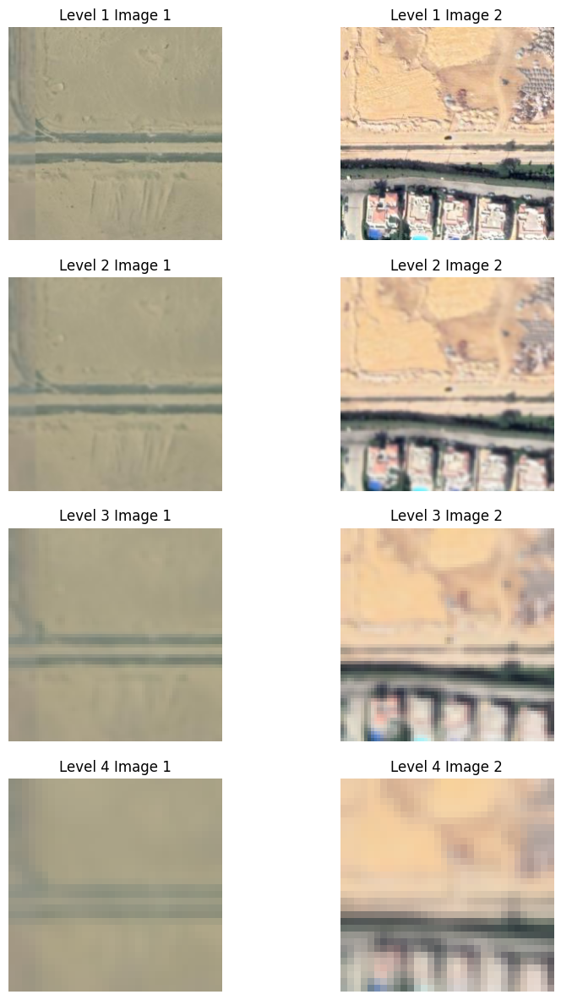

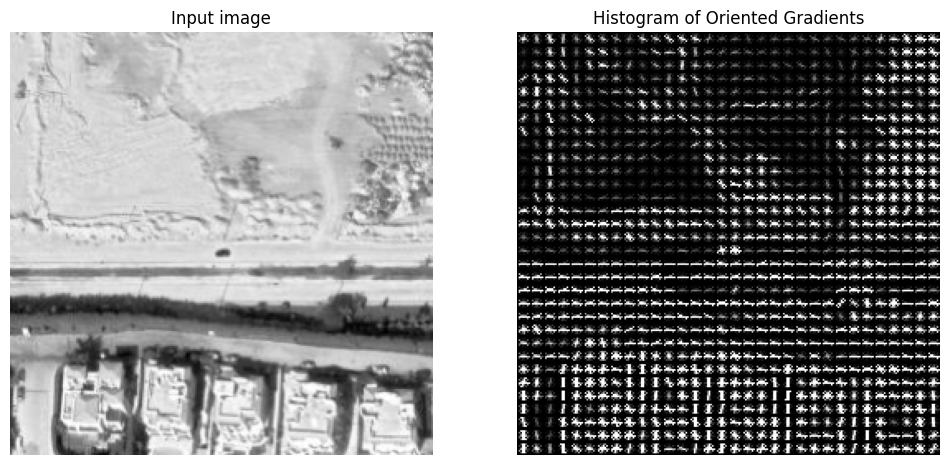

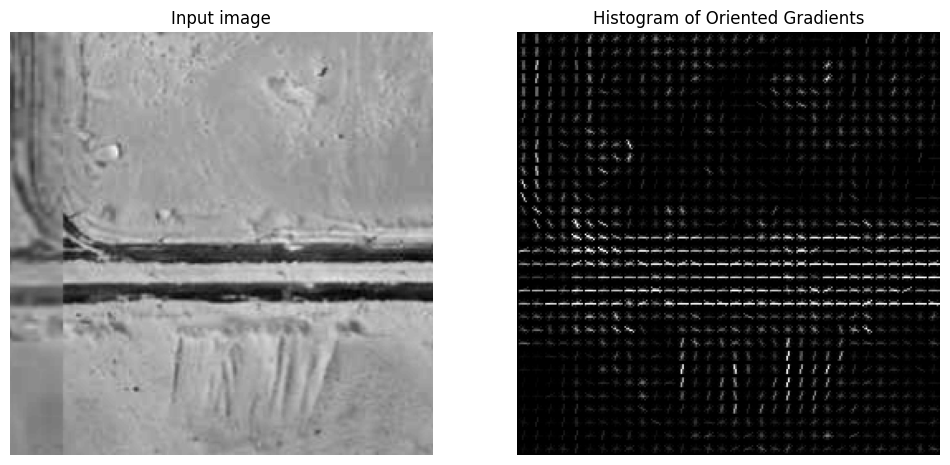

Shape of HOG descriptor 1: (34596,)
Shape of HOG descriptor 2: (34596,)


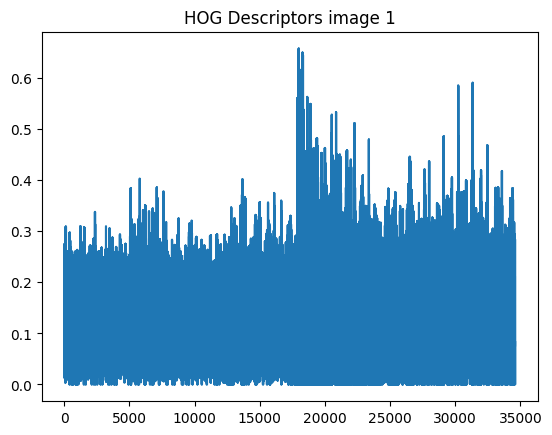

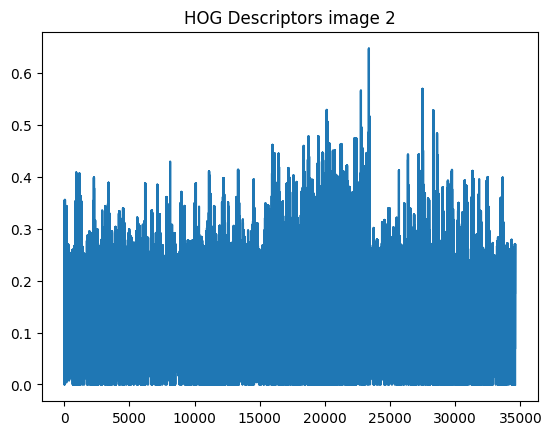

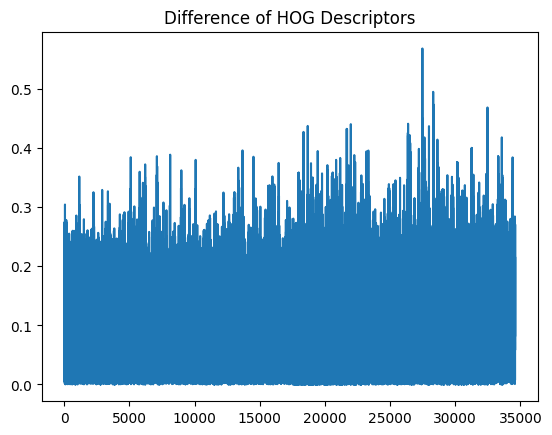

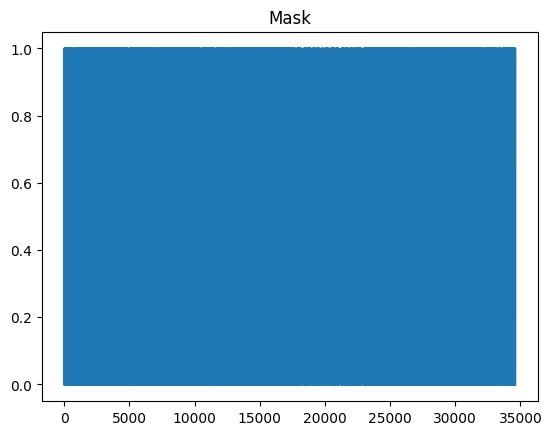

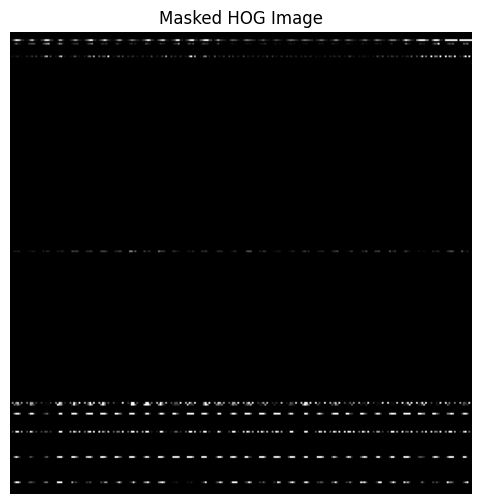

...

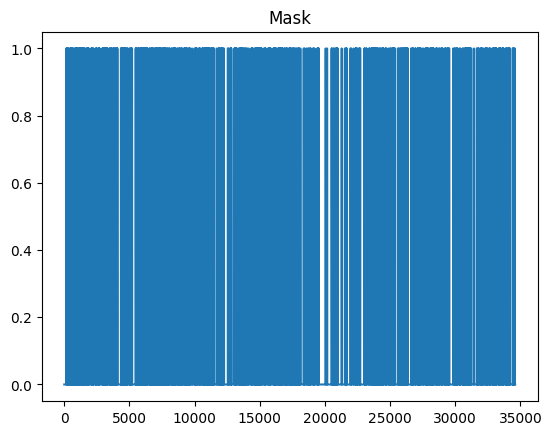

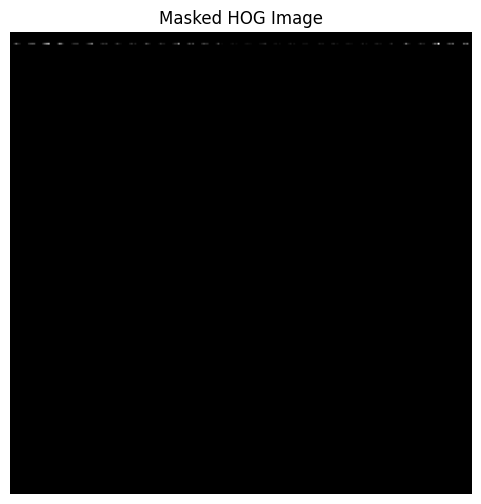

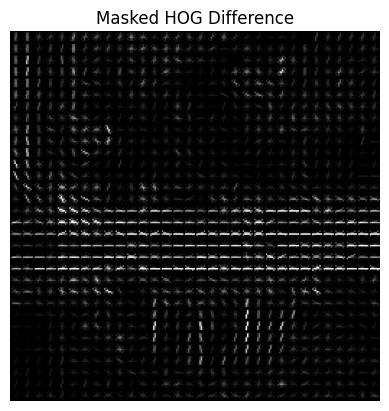

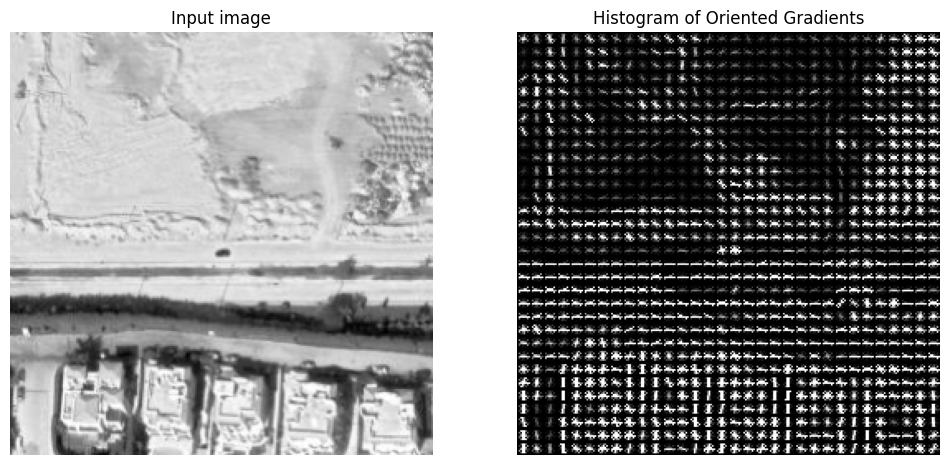

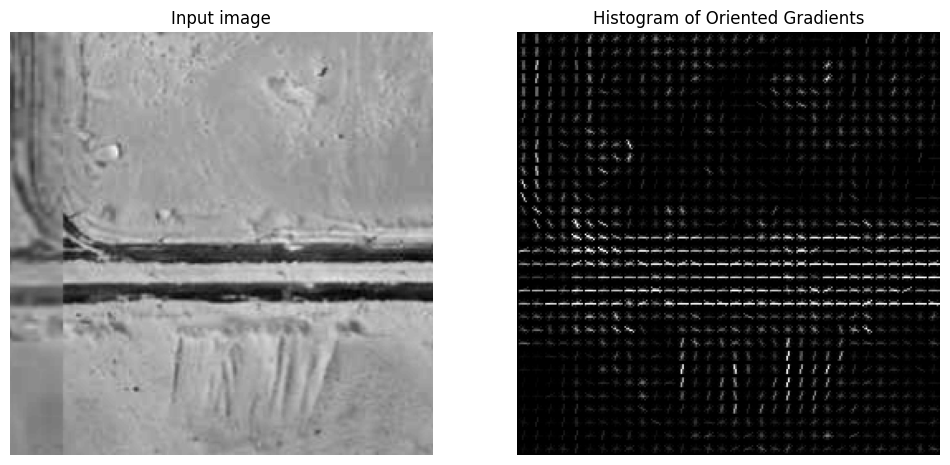

Shape of HOG descriptor 1: (34596,)
Shape of HOG descriptor 2: (34596,)


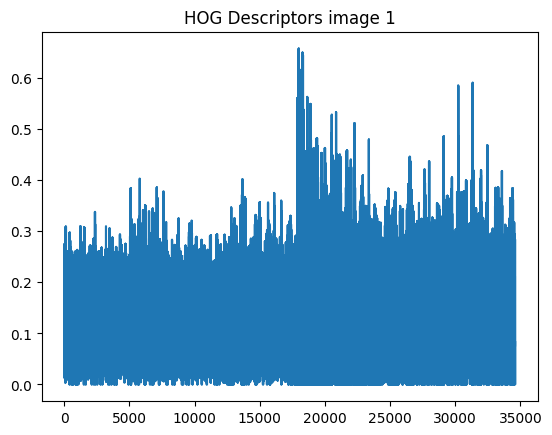

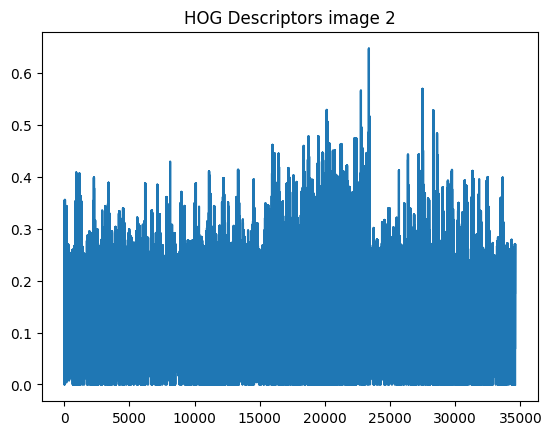

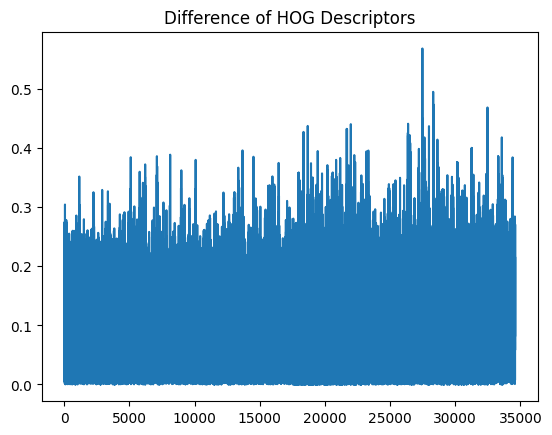

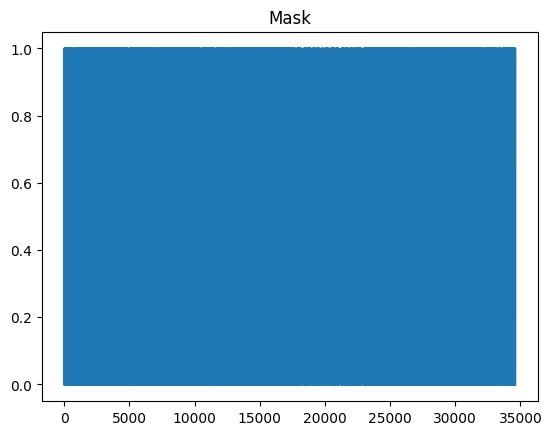

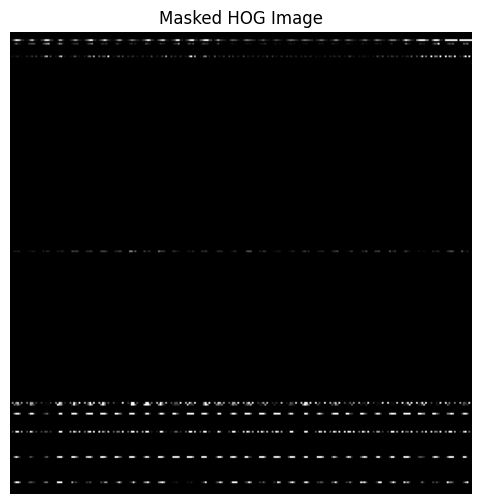

...

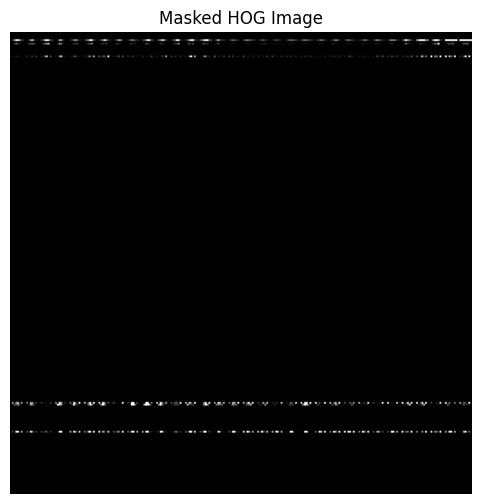

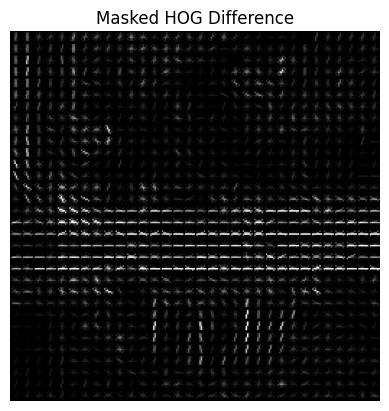

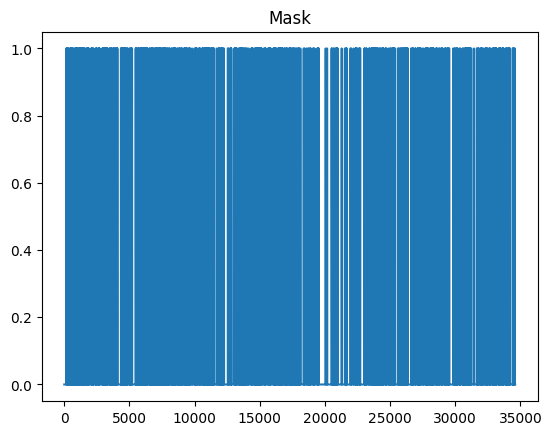

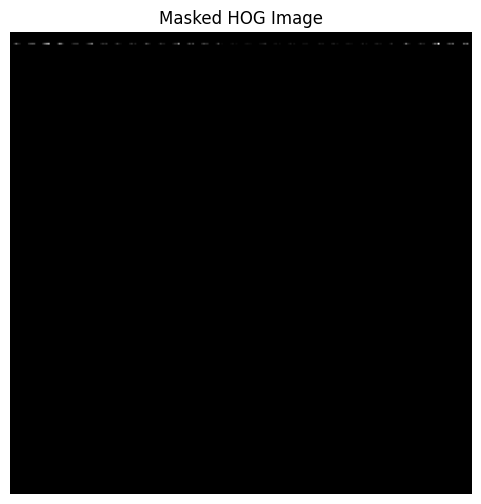

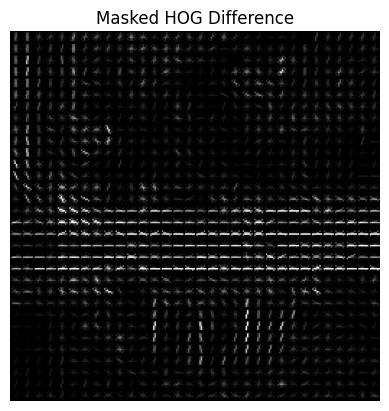

In [16]:
import cv2
import matplotlib.pyplot as plt

# Load the original PNG images
image1 = cv2.imread('../trainval/A/0020.png')
image2 = cv2.imread('../trainval/B/0020.png')

# Define the number of pyramid levels
num_levels = 4

# Create Gaussian pyramids for both images
gaussian_pyramid1 = [image1]
gaussian_pyramid2 = [image2]

# Apply Gaussian pyramid to image 1
for i in range(1, num_levels):
    blurred = cv2.GaussianBlur(gaussian_pyramid1[i-1], (5, 5), 0)
    downsampled = cv2.pyrDown(blurred)
    gaussian_pyramid1.append(downsampled)

# Apply Gaussian pyramid to image 2
for i in range(1, num_levels):
    blurred = cv2.GaussianBlur(gaussian_pyramid2[i-1], (5, 5), 0)
    downsampled = cv2.pyrDown(blurred)
    gaussian_pyramid2.append(downsampled)

# Visualize the pyramids
fig, axs = plt.subplots(num_levels, 2, figsize=(8, 12))
fig.tight_layout()

for i in range(num_levels):
    axs[i, 0].imshow(cv2.cvtColor(gaussian_pyramid1[i], cv2.COLOR_BGR2RGB))
    axs[i, 0].set_title(f'Level {i+1} Image 1')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(cv2.cvtColor(gaussian_pyramid2[i], cv2.COLOR_BGR2RGB))
    axs[i, 1].set_title(f'Level {i+1} Image 2')
    axs[i, 1].axis('off')

plt.show()

image_A=gaussian_pyramid1[1]
image_B=gaussian_pyramid2[1]

getandPlotHOG_DIFF(image_A,image_B)

image_A=gaussian_pyramid1[3]
image_B=gaussian_pyramid2[3]

getandPlotHOG_DIFF(image_A,image_B)



## Trial (4): Structural Similarity index

In [3]:
import cv2
from sklearn.metrics import jaccard_score
import random
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
import os

SSIM Threshold: 0.25


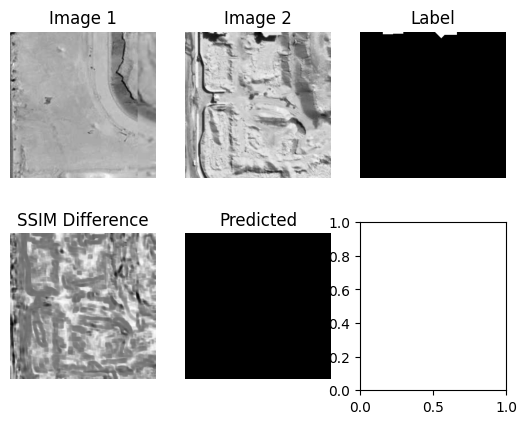

Image no : 1
jaccard index: 0.0
ssim score: 0.2617707411835966


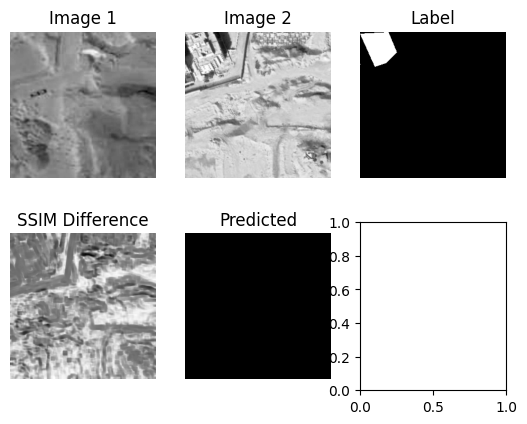

Image no : 2
jaccard index: 0.0
ssim score: 0.3061649442420672


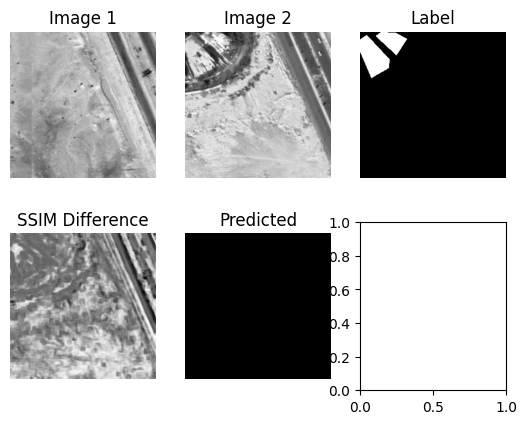

Image no : 3
jaccard index: 0.0
ssim score: 0.2927146696009133


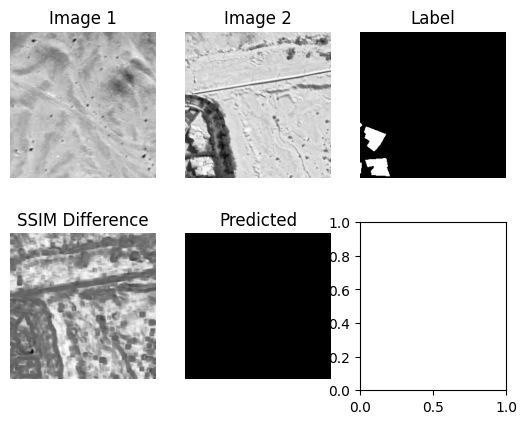

Image no : 4
jaccard index: 0.0
ssim score: 0.3204840112555319


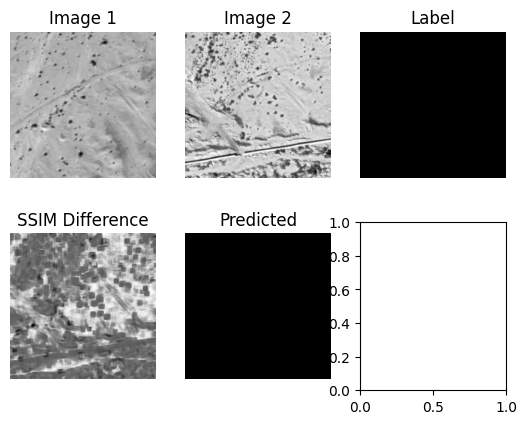

Image no : 5
jaccard index: 1.0
ssim score: 0.2643703565253891


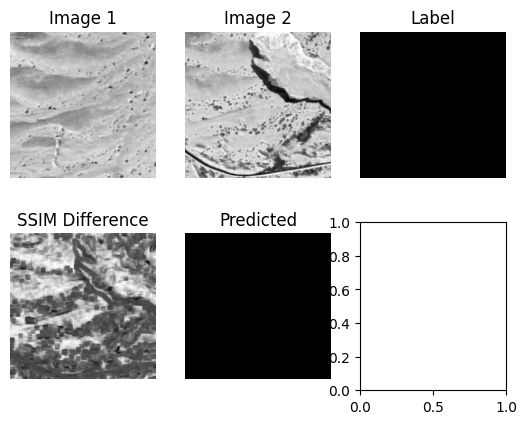

Image no : 6
jaccard index: 1.0
ssim score: 0.29995271452198663


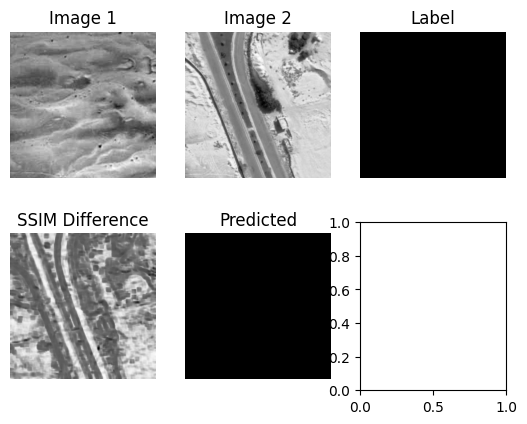

Image no : 7
jaccard index: 1.0
ssim score: 0.31957406936890403


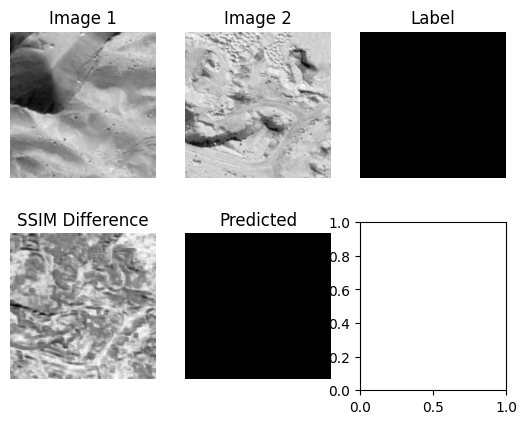

Image no : 8
jaccard index: 1.0
ssim score: 0.3392015098528263


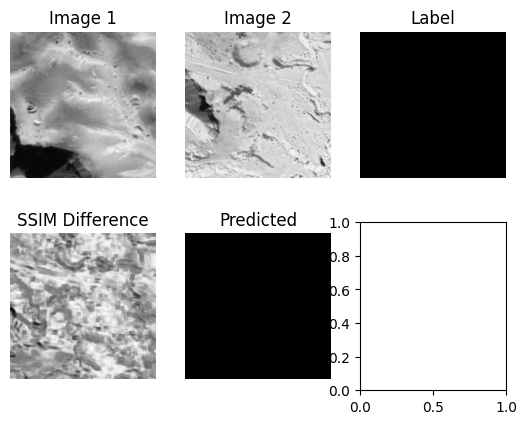

Image no : 9
jaccard index: 1.0
ssim score: 0.3800743730016795
Image no : 10
jaccard index: 0.0
ssim score: 0.28137565797527775
Image no : 11
jaccard index: 0.0
ssim score: 0.34765451875059367
Image no : 12
jaccard index: 1.0
ssim score: 0.41619846490940693
Image no : 13
jaccard index: 0.02370814542339573
ssim score: 0.2444181507363974
Image no : 14
jaccard index: 0.0
ssim score: 0.27763900488091703
Image no : 15
jaccard index: 1.0
ssim score: 0.5403176766606498
Image no : 16
jaccard index: 0.08727325708457784
ssim score: 0.21436422106550082
Image no : 17
jaccard index: 0.004820420600429592
ssim score: 0.23224340829789267
Image no : 18
jaccard index: 1.0
ssim score: 0.36015581867081586
Image no : 19
jaccard index: 0.0
ssim score: 0.4197662462259598
Image no : 20
jaccard index: 0.0
ssim score: 0.33692982147340833
Image no : 21
jaccard index: 0.11140729341284454
ssim score: 0.2402106809134364
Image no : 22
jaccard index: 0.09542265474708611
ssim score: 0.13337529222331704
Image no : 23
j

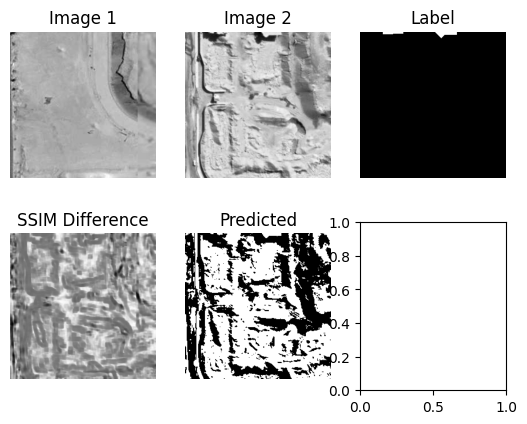

Image no : 1
jaccard index: 0.006237492528003742
ssim score: 0.2617707411835966


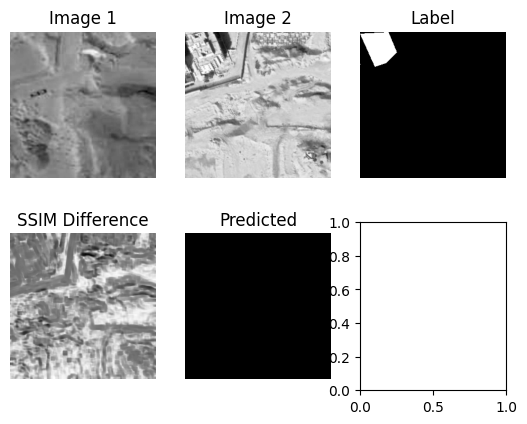

Image no : 2
jaccard index: 0.0
ssim score: 0.3061649442420672


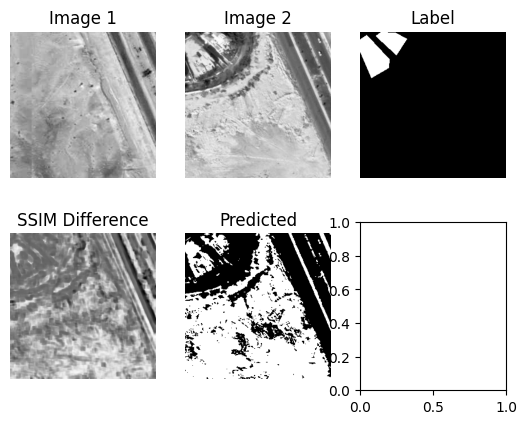

Image no : 3
jaccard index: 0.05971474977159679
ssim score: 0.2927146696009133


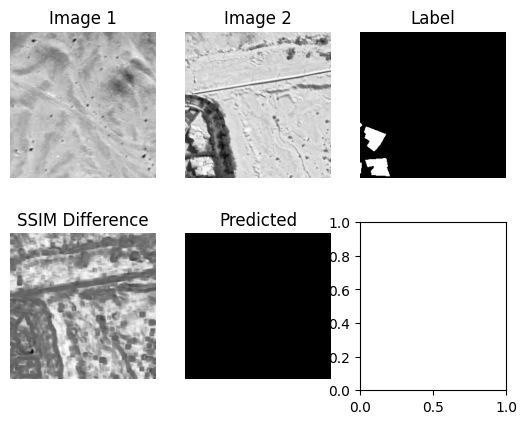

Image no : 4
jaccard index: 0.0
ssim score: 0.3204840112555319


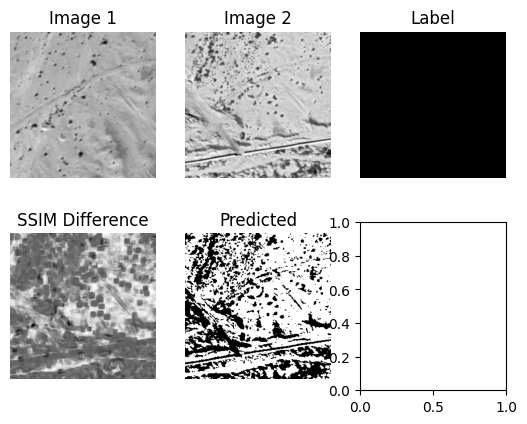

Image no : 5
jaccard index: 0.0
ssim score: 0.2643703565253891


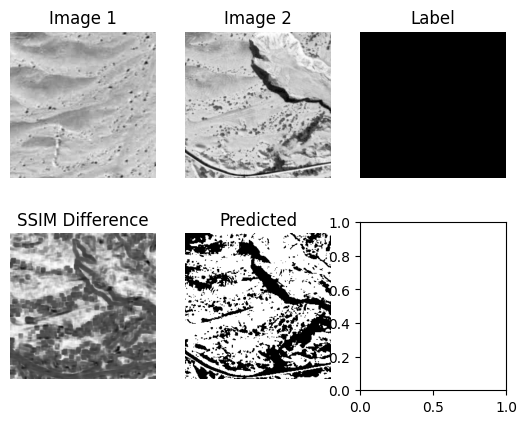

Image no : 6
jaccard index: 0.0
ssim score: 0.29995271452198663


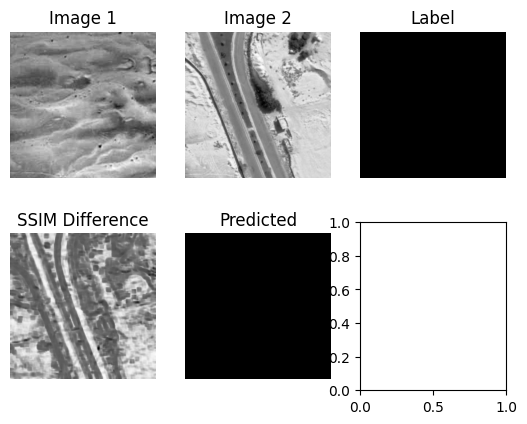

Image no : 7
jaccard index: 1.0
ssim score: 0.31957406936890403


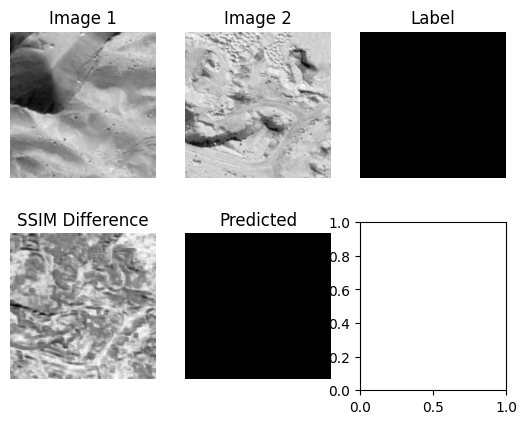

Image no : 8
jaccard index: 1.0
ssim score: 0.3392015098528263


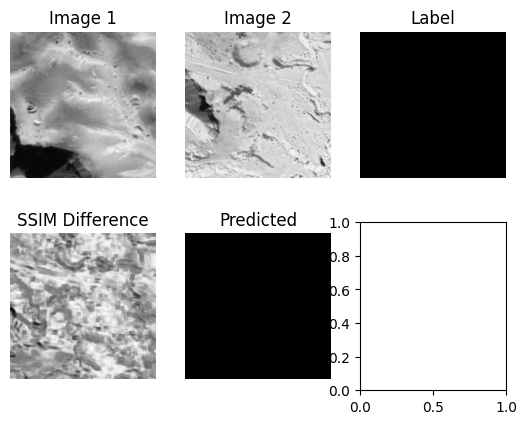

Image no : 9
jaccard index: 1.0
ssim score: 0.3800743730016795
Image no : 10
jaccard index: 0.031703054618849535
ssim score: 0.28137565797527775
Image no : 11
jaccard index: 0.0
ssim score: 0.34765451875059367
Image no : 12
jaccard index: 1.0
ssim score: 0.41619846490940693
Image no : 13
jaccard index: 0.02370814542339573
ssim score: 0.2444181507363974
Image no : 14
jaccard index: 0.021884245788199624
ssim score: 0.27763900488091703
Image no : 15
jaccard index: 1.0
ssim score: 0.5403176766606498
Image no : 16
jaccard index: 0.08727325708457784
ssim score: 0.21436422106550082
Image no : 17
jaccard index: 0.004820420600429592
ssim score: 0.23224340829789267
Image no : 18
jaccard index: 1.0
ssim score: 0.36015581867081586
Image no : 19
jaccard index: 0.0
ssim score: 0.4197662462259598
Image no : 20
jaccard index: 0.0
ssim score: 0.33692982147340833
Image no : 21
jaccard index: 0.11140729341284454
ssim score: 0.2402106809134364
Image no : 22
jaccard index: 0.09542265474708611
ssim score: 0

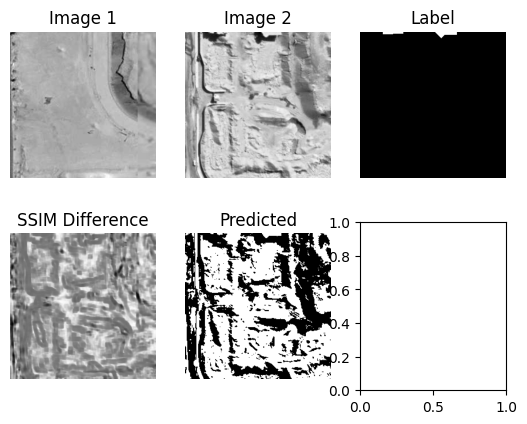

Image no : 1
jaccard index: 0.006237492528003742
ssim score: 0.2617707411835966


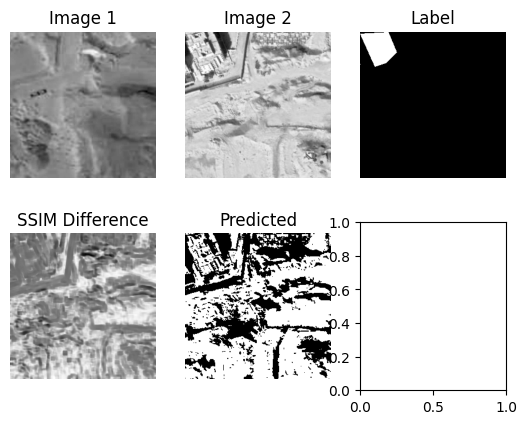

Image no : 2
jaccard index: 0.0360523083592226
ssim score: 0.3061649442420672


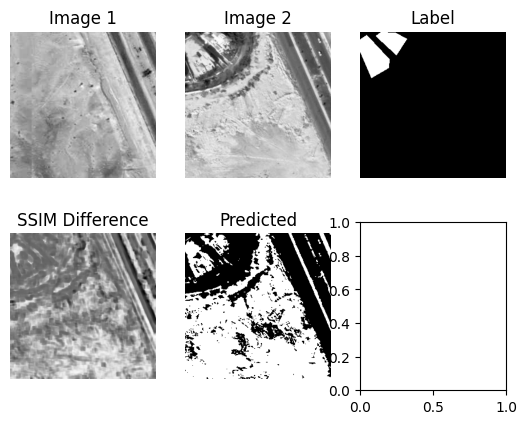

Image no : 3
jaccard index: 0.05971474977159679
ssim score: 0.2927146696009133


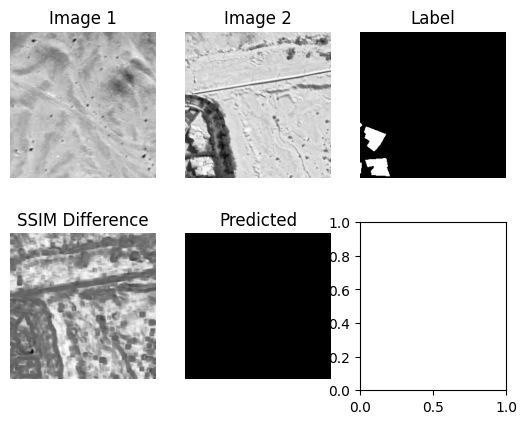

Image no : 4
jaccard index: 0.0
ssim score: 0.3204840112555319


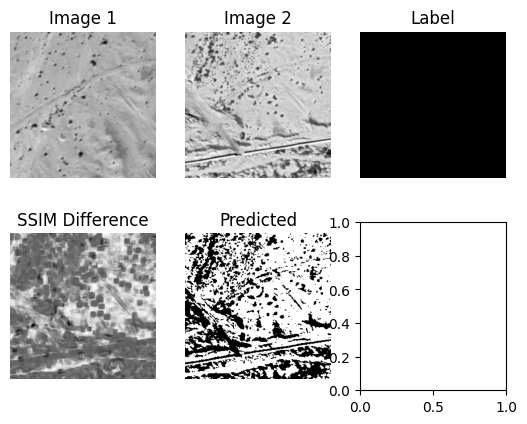

Image no : 5
jaccard index: 0.0
ssim score: 0.2643703565253891


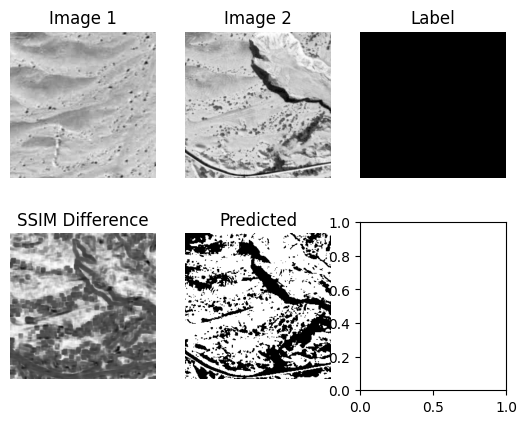

Image no : 6
jaccard index: 0.0
ssim score: 0.29995271452198663


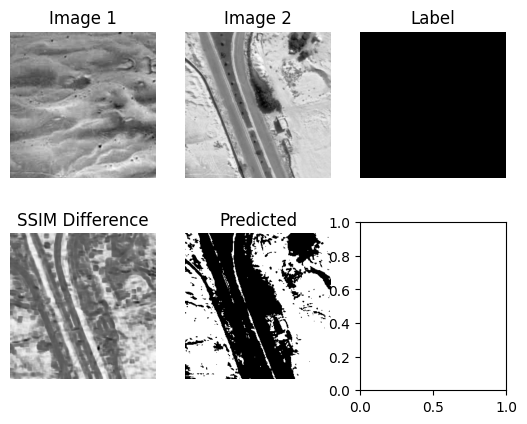

Image no : 7
jaccard index: 0.0
ssim score: 0.31957406936890403


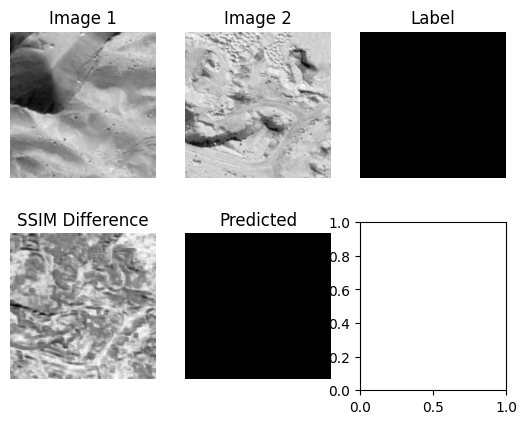

Image no : 8
jaccard index: 1.0
ssim score: 0.3392015098528263


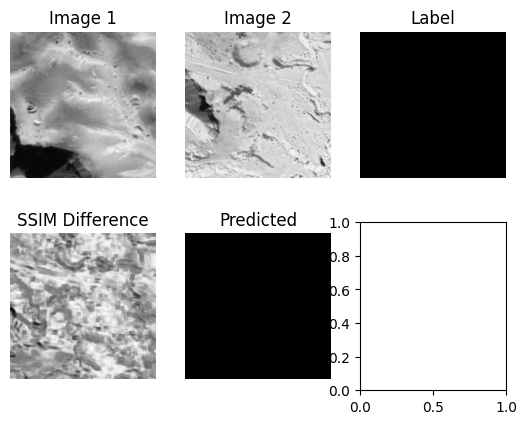

Image no : 9
jaccard index: 1.0
ssim score: 0.3800743730016795
Image no : 10
jaccard index: 0.031703054618849535
ssim score: 0.28137565797527775
Image no : 11
jaccard index: 0.0
ssim score: 0.34765451875059367
Image no : 12
jaccard index: 1.0
ssim score: 0.41619846490940693
Image no : 13
jaccard index: 0.02370814542339573
ssim score: 0.2444181507363974
Image no : 14
jaccard index: 0.021884245788199624
ssim score: 0.27763900488091703
Image no : 15
jaccard index: 1.0
ssim score: 0.5403176766606498
Image no : 16
jaccard index: 0.08727325708457784
ssim score: 0.21436422106550082
Image no : 17
jaccard index: 0.004820420600429592
ssim score: 0.23224340829789267
Image no : 18
jaccard index: 1.0
ssim score: 0.36015581867081586
Image no : 19
jaccard index: 0.0
ssim score: 0.4197662462259598
Image no : 20
jaccard index: 0.0
ssim score: 0.33692982147340833
Image no : 21
jaccard index: 0.11140729341284454
ssim score: 0.2402106809134364
Image no : 22
jaccard index: 0.09542265474708611
ssim score: 0

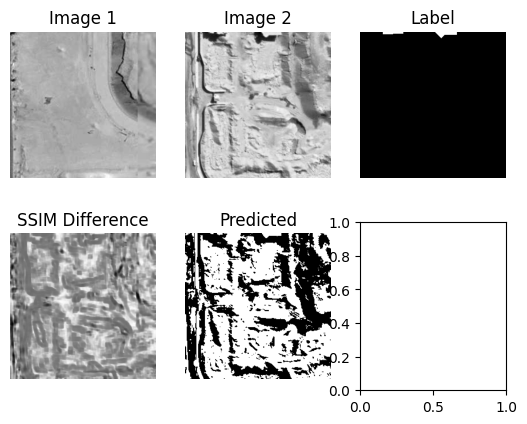

Image no : 1
jaccard index: 0.006237492528003742
ssim score: 0.2617707411835966


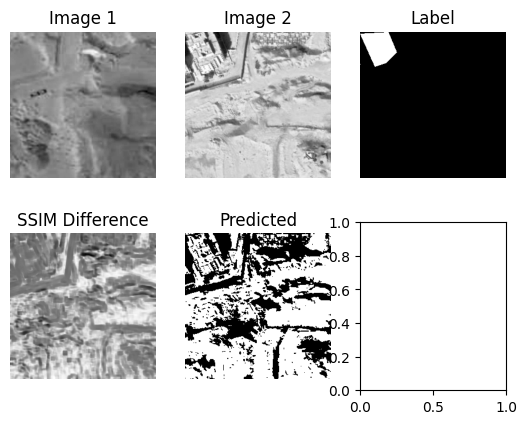

Image no : 2
jaccard index: 0.0360523083592226
ssim score: 0.3061649442420672


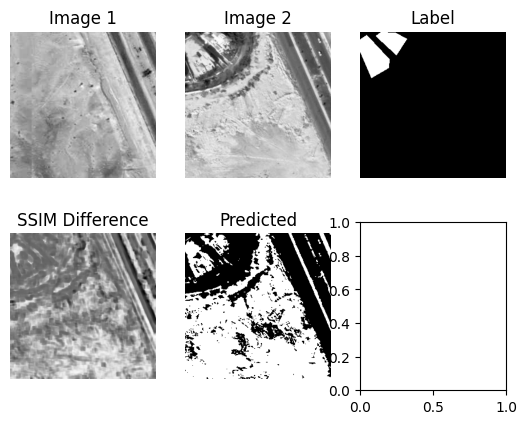

Image no : 3
jaccard index: 0.05971474977159679
ssim score: 0.2927146696009133


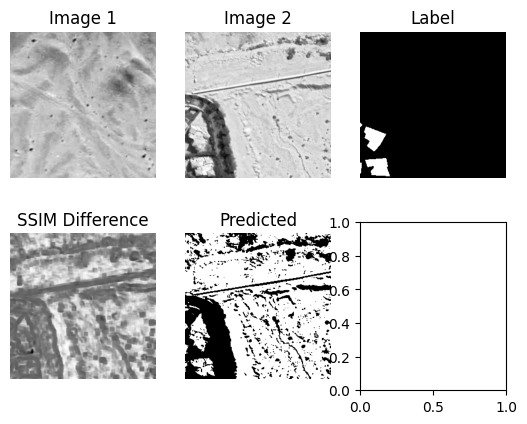

Image no : 4
jaccard index: 0.028979266691067238
ssim score: 0.3204840112555319


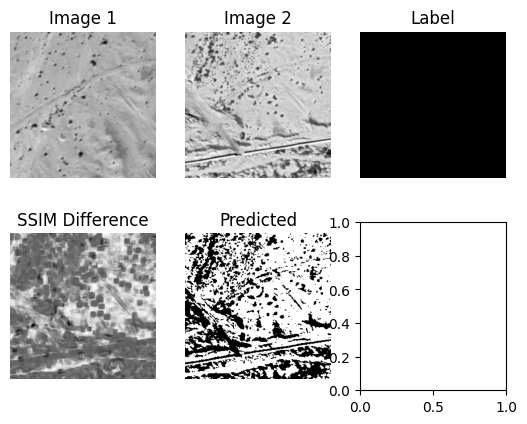

Image no : 5
jaccard index: 0.0
ssim score: 0.2643703565253891


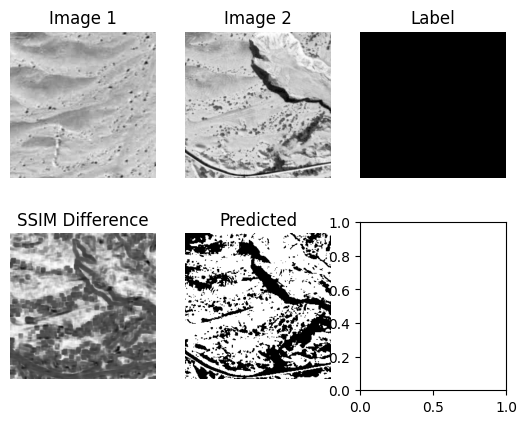

Image no : 6
jaccard index: 0.0
ssim score: 0.29995271452198663


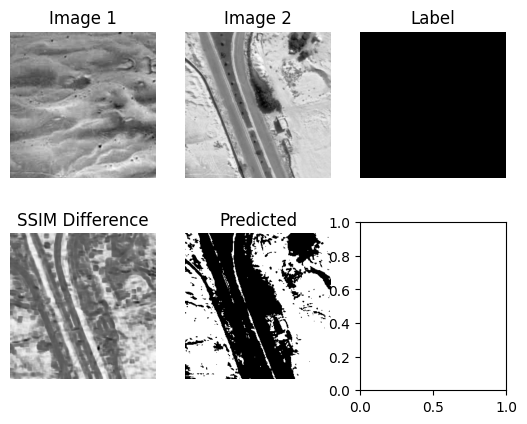

Image no : 7
jaccard index: 0.0
ssim score: 0.31957406936890403


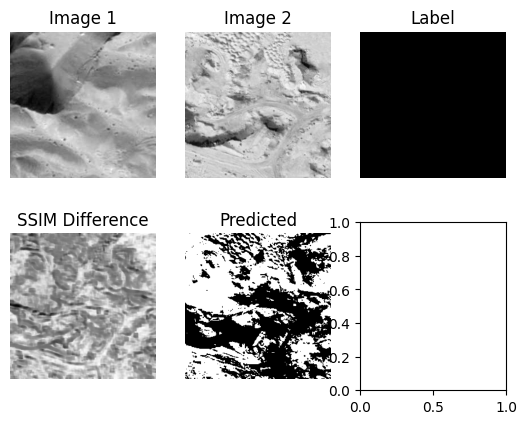

Image no : 8
jaccard index: 0.0
ssim score: 0.3392015098528263


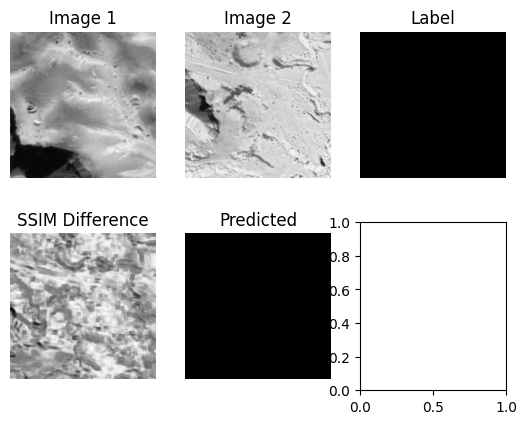

Image no : 9
jaccard index: 1.0
ssim score: 0.3800743730016795
Image no : 10
jaccard index: 0.031703054618849535
ssim score: 0.28137565797527775
Image no : 11
jaccard index: 0.12630740642421023
ssim score: 0.34765451875059367
Image no : 12
jaccard index: 1.0
ssim score: 0.41619846490940693
Image no : 13
jaccard index: 0.02370814542339573
ssim score: 0.2444181507363974
Image no : 14
jaccard index: 0.021884245788199624
ssim score: 0.27763900488091703
Image no : 15
jaccard index: 1.0
ssim score: 0.5403176766606498
Image no : 16
jaccard index: 0.08727325708457784
ssim score: 0.21436422106550082
Image no : 17
jaccard index: 0.004820420600429592
ssim score: 0.23224340829789267
Image no : 18
jaccard index: 1.0
ssim score: 0.36015581867081586
Image no : 19
jaccard index: 0.0
ssim score: 0.4197662462259598
Image no : 20
jaccard index: 0.07510358642263261
ssim score: 0.33692982147340833
Image no : 21
jaccard index: 0.11140729341284454
ssim score: 0.2402106809134364
Image no : 22
jaccard index: 0

In [16]:
orientations = 8
pixels_per_cell = (16, 16)
cells_per_block = (1, 1)
# Load images from folders A and B
folder_A = '../trainval/A'
folder_B = '../trainval/B'
folder_labels = '../trainval/label'

image_filenames = sorted(os.listdir(folder_A))

jaccard_scores = []
accuracies = []
ssim_thresholds = [0.25, 0.3, 0.32, 0.35]
jaccard_scores_thres=[]
import time

for ssim_threshold in ssim_thresholds:
    print(f"SSIM Threshold: {ssim_threshold}")
    img_no = 0
    start_time = time.time()
    
    for filename in image_filenames:
        # Load images
        image_A = cv2.imread(os.path.join(folder_A, filename))
        image_B = cv2.imread(os.path.join(folder_B, filename))
        label = cv2.imread(os.path.join(folder_labels, filename), cv2.IMREAD_GRAYSCALE)
        # Convert all images into gray
        image1 = cv2.cvtColor(image_A, cv2.COLOR_BGR2GRAY)
        image2 = cv2.cvtColor(image_B, cv2.COLOR_BGR2GRAY)
        #Image Differencing
        diff_img = cv2.subtract(image2, image1)
        diff_img[diff_img < 0] = 0
        avg = np.mean(diff_img)
        pred = diff_img.copy()
        pred[diff_img > avg] = 255
        pred[diff_img <= avg] = 0
        ssim_score, diff_ssim = ssim(image1,image2, full=True)
        if(ssim_score > ssim_threshold):
            pred = np.zeros_like(pred)
            
        
        # Uniform the units to avoid the error of multi-label in comparing
        label[label == 255] = 1
        pred[pred == 255] = 1
        jacard_index = jaccard_score(label.flatten(), pred.flatten(), zero_division=1)
        jaccard_scores.append(jacard_index)
        img_no+=1
        if img_no<10:
            fig, axs = plt.subplots(2, 3)
            axs[0, 0].imshow(image1, cmap='gray')
            axs[0, 0].set_title('Image 1')
            axs[0, 0].axis('off')
            axs[0, 1].imshow(image2, cmap='gray')
            axs[0, 1].set_title('Image 2')
            axs[0, 1].axis('off')
            axs[0, 2].imshow(label, cmap='gray')
            axs[0, 2].set_title('Label')
            axs[0, 2].axis('off')
            axs[1, 0].imshow(diff_ssim, cmap='gray')
            axs[1, 0].set_title('SSIM Difference')
            axs[1, 0].axis('off')
            axs[1, 1].imshow(pred, cmap='gray')
            axs[1, 1].set_title('Predicted')
            axs[1, 1].axis('off')
            plt.show()
        print("Image no :",img_no)
        print(f'jaccard index: {jacard_index}')
        print(f'ssim score: {ssim_score}')
    
    print("=====================================FINISHED===============================")
    end_time = time.time()
    print("mIoU: ",np.mean(jaccard_scores))
    jaccard_scores_thres.append(np.mean(jaccard_scores))
    print("Takes: ",np.abs(end_time-start_time))


In [17]:
print(jaccard_scores_thres)

[0.8266276255641892, 0.8196791154483025, 0.813932491497532, 0.8064293148365606]


## So 0.25 is the best threshold